Imagem original em escala de cinza


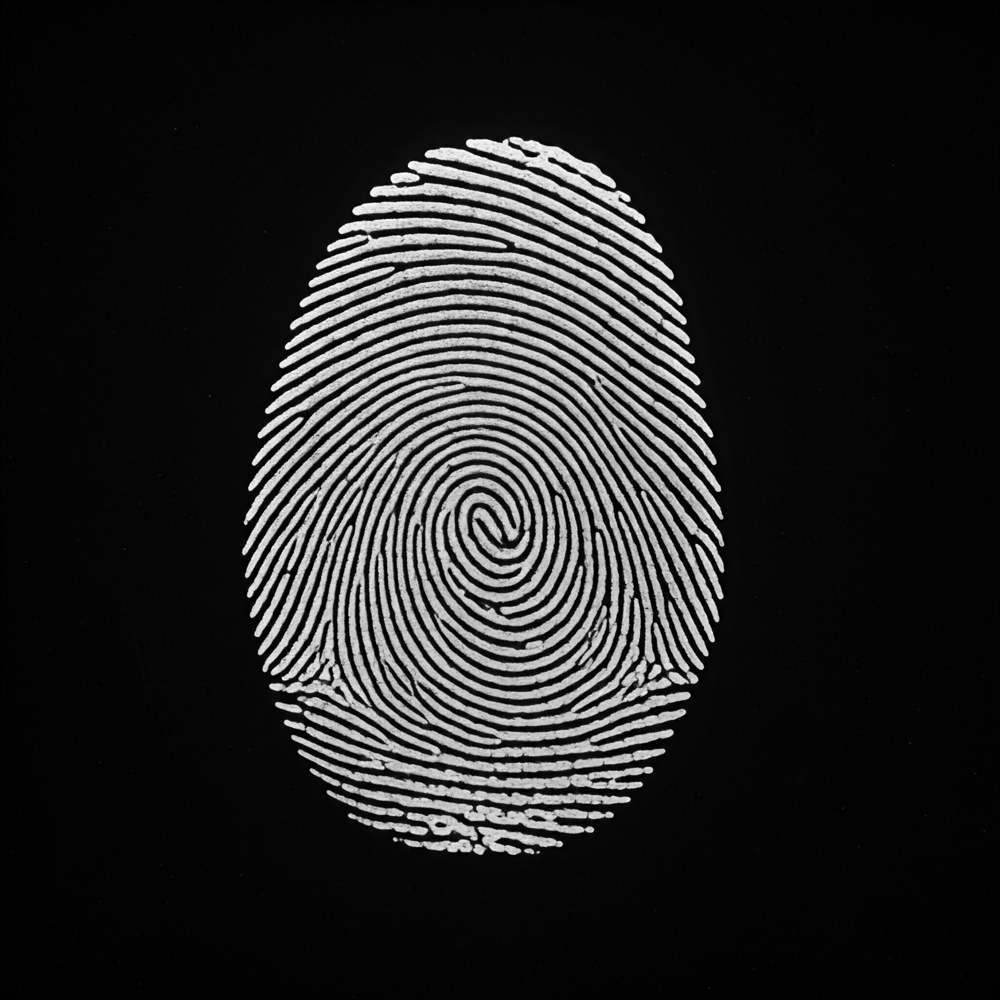

Imagem com ruído Gaussiano


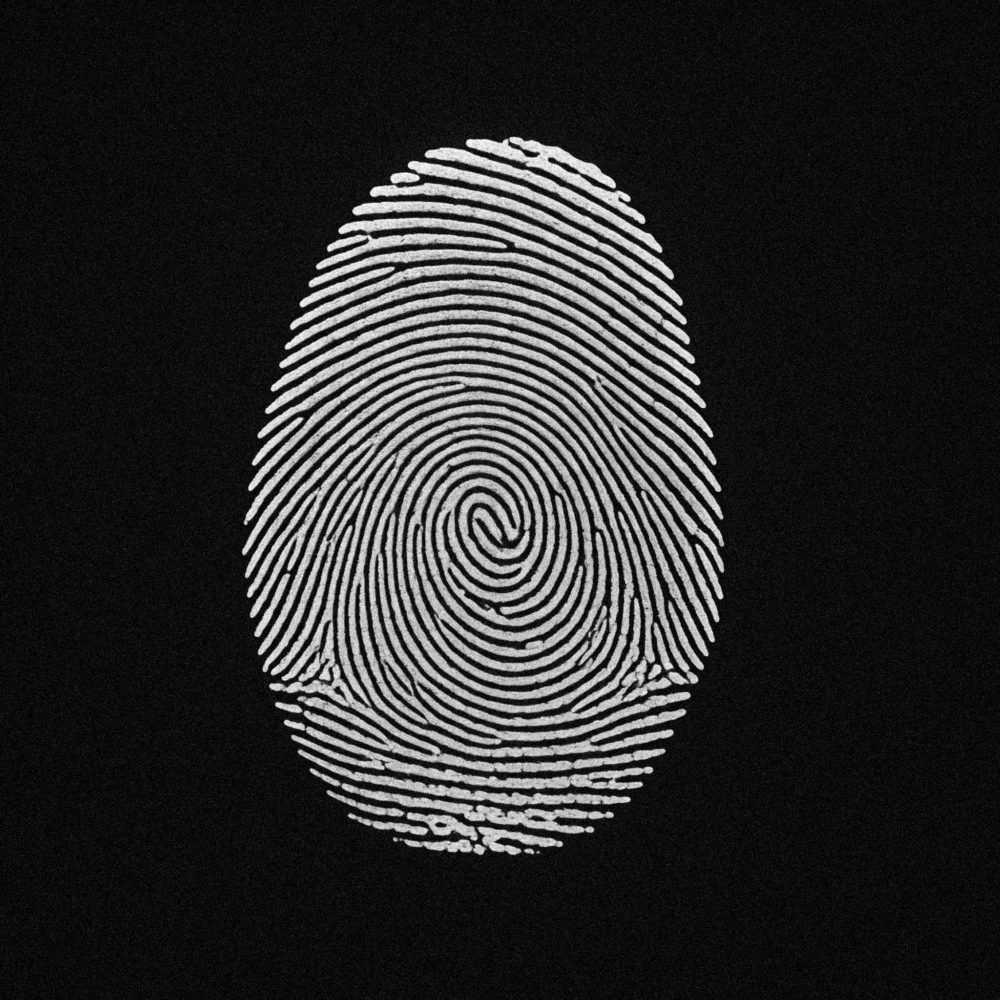

Imagem com ruído Sal e Pimenta


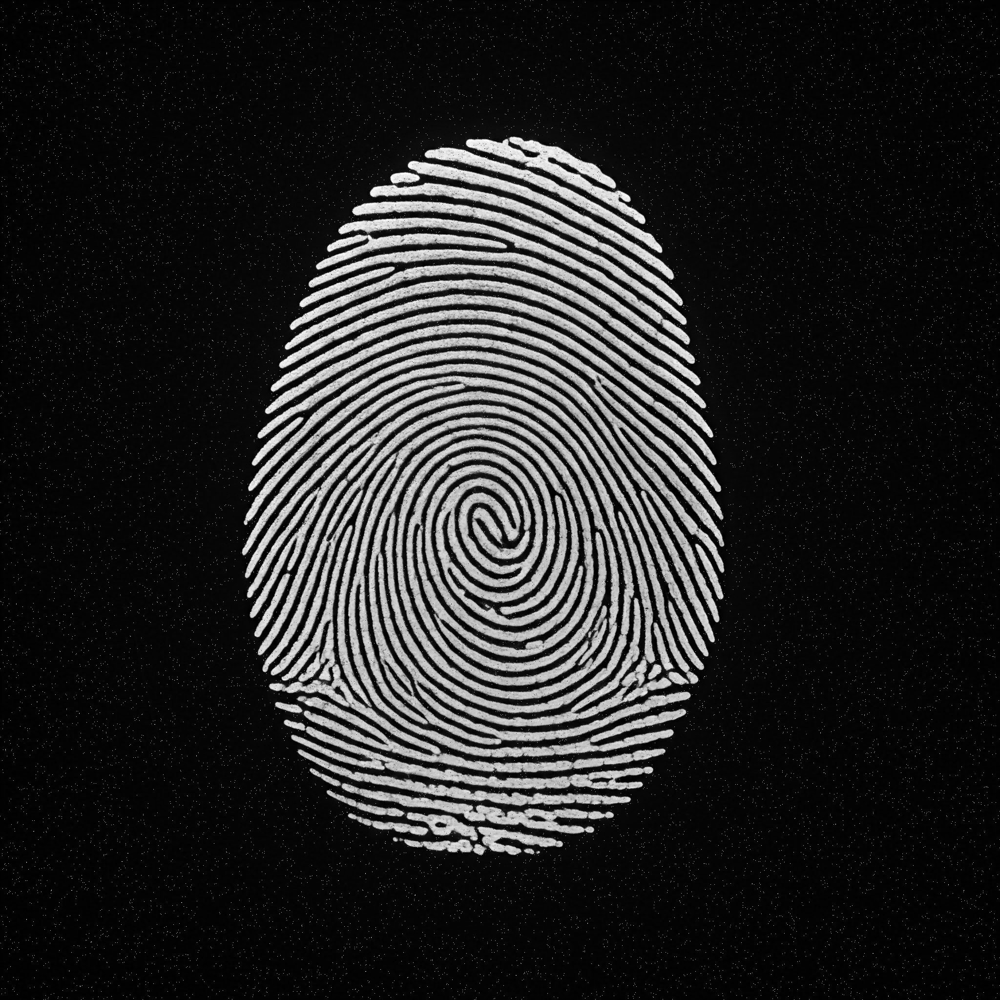

True

In [10]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from skimage.util import random_noise

# 1. Carregar a imagem da impressão digital
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/images/biometria.jpeg', 0)  # Substitua 'fingerprint.png' pelo nome do arquivo
print("Imagem original em escala de cinza")
cv2_imshow(img)
cv2.imwrite('img_grayscale.png', img)

# 2. Aplicar ruído (Gaussiano e Sal e Pimenta)
gaussian_noisy_img = random_noise(img, mode='gaussian', var=0.009)
gaussian_noisy_img = np.array(255*gaussian_noisy_img, dtype = 'uint8')
print("Imagem com ruído Gaussiano")
cv2_imshow(gaussian_noisy_img)
cv2.imwrite('gaussian_noisy_img.png', gaussian_noisy_img)


salt_pepper_noisy_img = random_noise(img, mode='s&p', amount=0.01)
salt_pepper_noisy_img = np.array(255*salt_pepper_noisy_img, dtype = 'uint8')
print("Imagem com ruído Sal e Pimenta")
cv2_imshow(salt_pepper_noisy_img)
cv2.imwrite('salt_pepper_noisy_img.png', salt_pepper_noisy_img)

Limiarização Basica (Gaussiano)


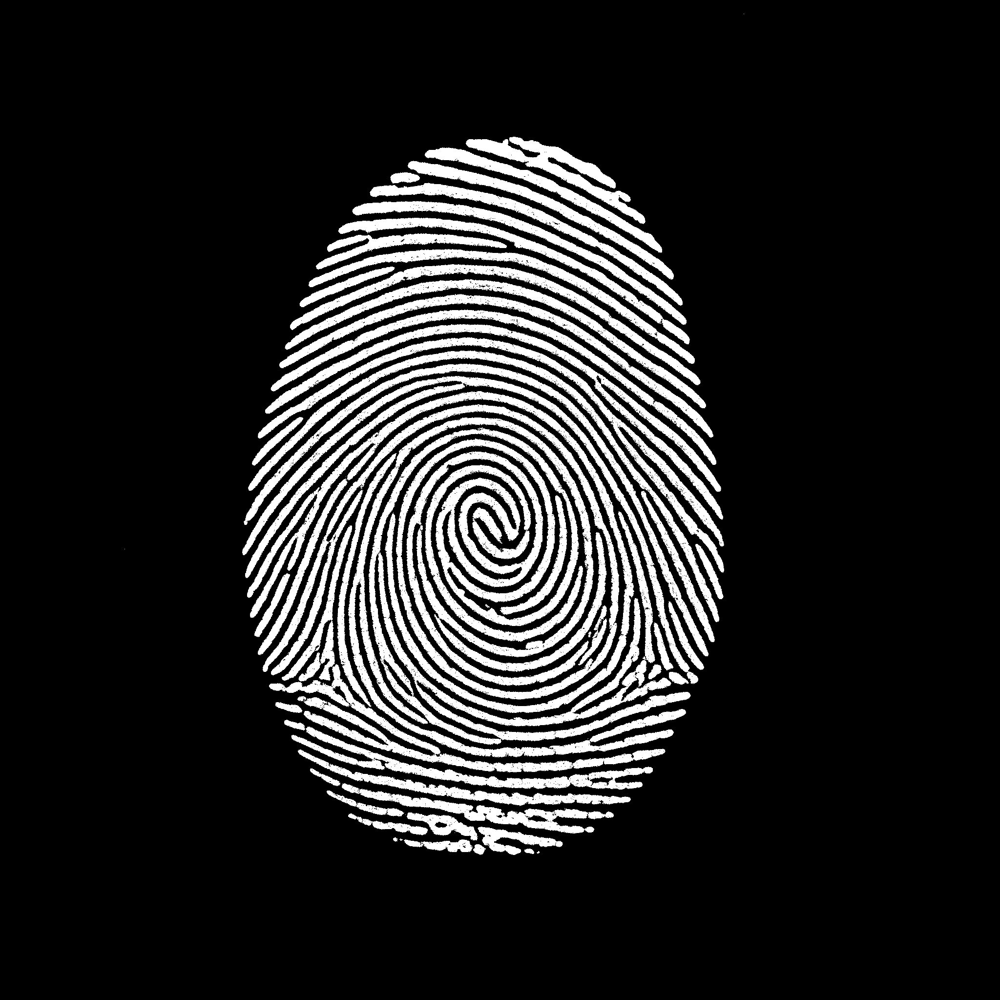

Limiarização Basica (Sal e Pimenta)


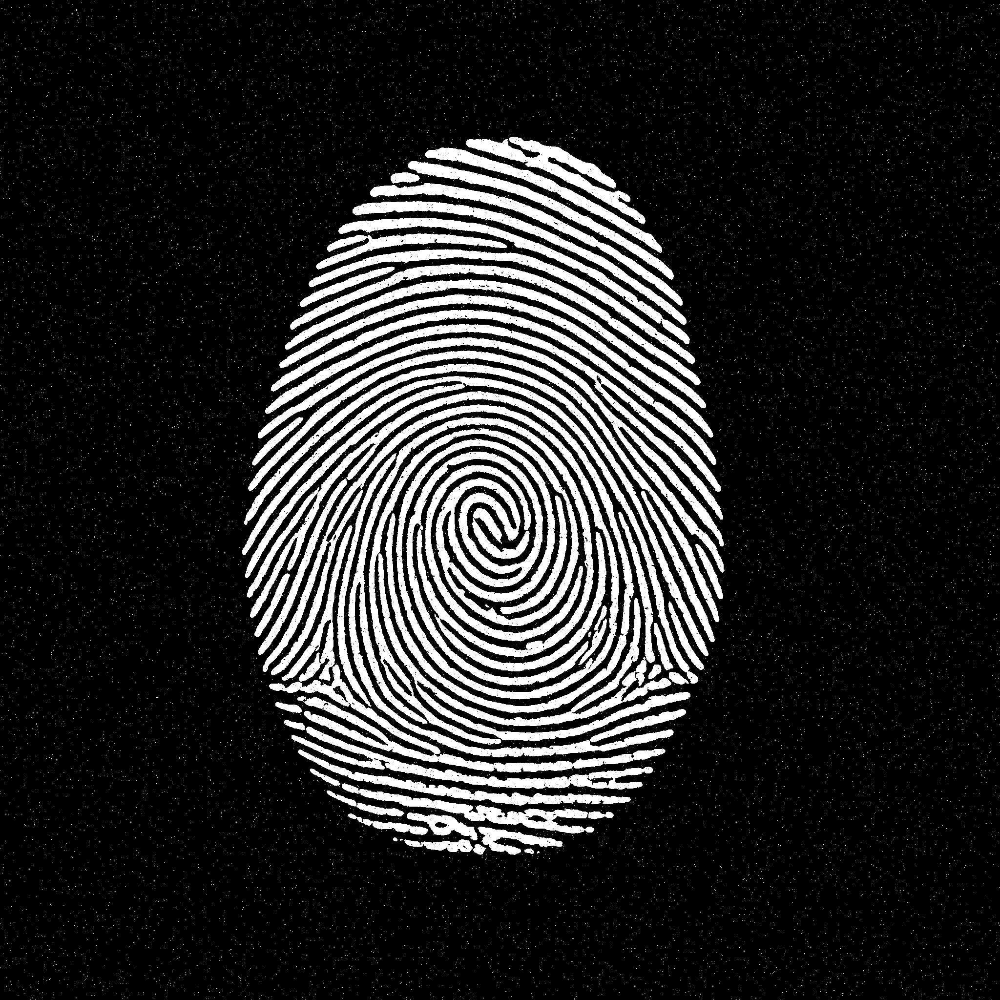

Limiarização Otsu (Gaussiano)


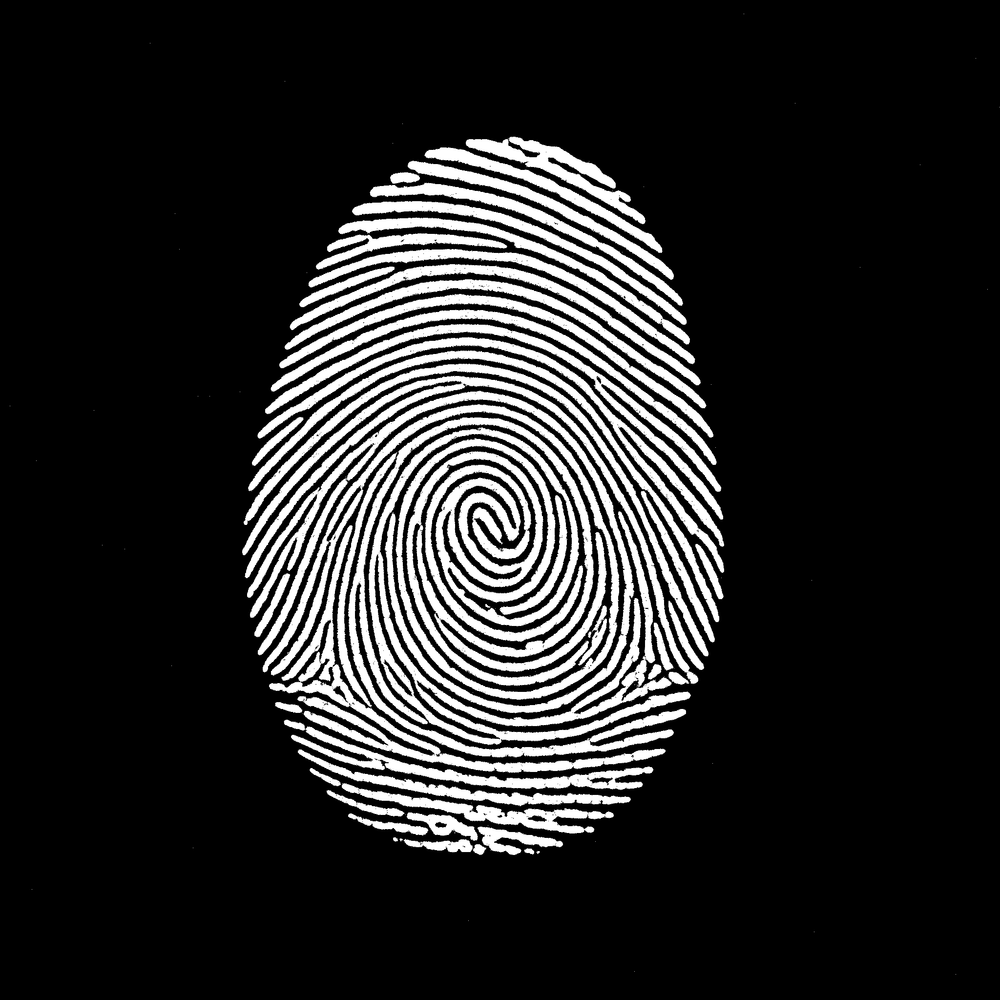

Limiarização Otsu (Sal e Pimenta)


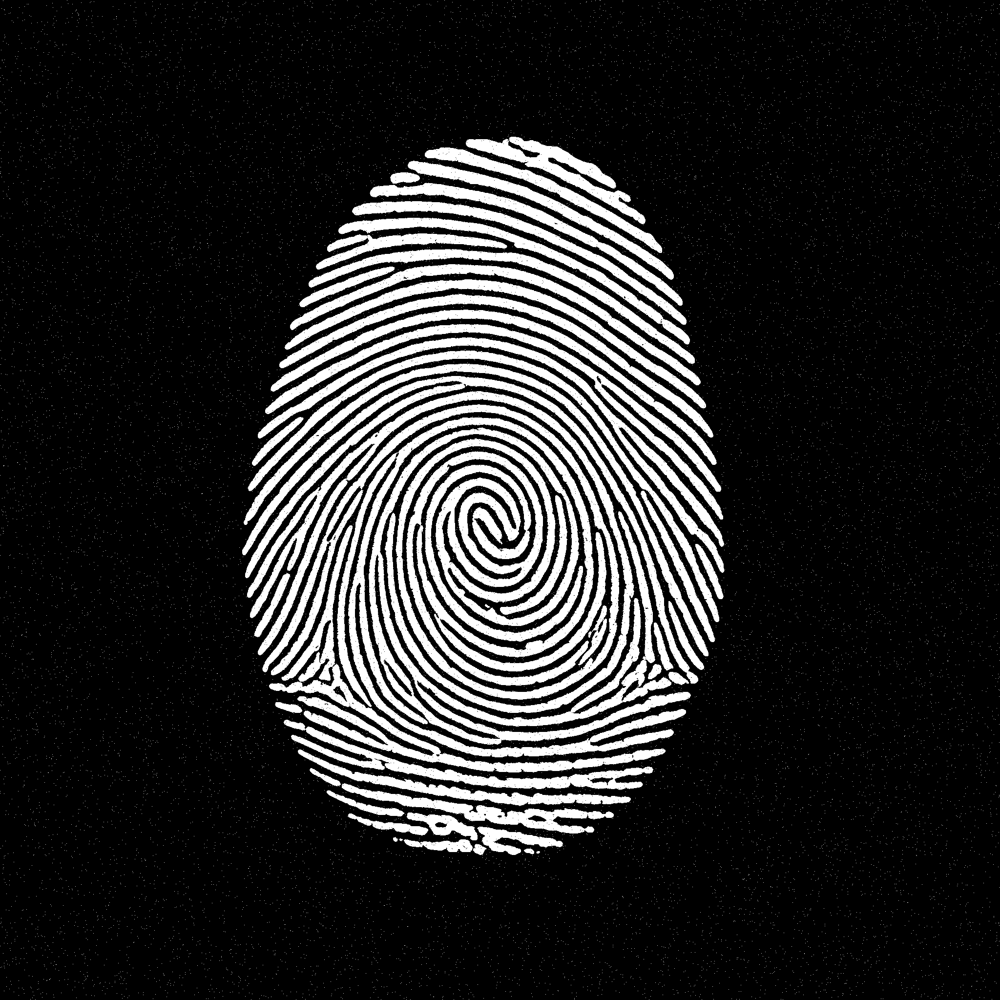

True

In [6]:
# 3. Limiarizacao (Basica e Otsu)
#Limiarizacao Basica
def limiarizacao_basica(imagem, limiar):
  # Cria uma cópia da imagem para evitar modificações no original
  imagem_limiarizada = np.copy(imagem)

  # Itera sobre cada pixel da imagem
  linhas, colunas = imagem.shape
  for i in range(linhas):
    for j in range(colunas):
      # Aplica a limiarização: se o pixel for maior ou igual ao limiar, define como 255, caso contrário, define como 0.
      if imagem[i, j] >= limiar:
        imagem_limiarizada[i, j] = 255
      else:
        imagem_limiarizada[i, j] = 0

  return imagem_limiarizada

#Limiarizacao Otsu
def limiarizacao_otsu(image):
    # Calcula o histograma da imagem manualmente
    hist = [0] * 256
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            hist[image[i, j]] += 1

    # Calcula as probabilidades de cada nível de cinza
    probabilities = [x / float(image.shape[0] * image.shape[1]) for x in hist]

    # Calcula a probabilidade acumulada
    cumulative_probability = [0] * 256
    cumulative_probability[0] = probabilities[0]
    for i in range(1, 256):
        cumulative_probability[i] = cumulative_probability[i-1] + probabilities[i]

    # Calcula a média da imagem
    mean = 0.0
    for i in range(256):
        mean += i * probabilities[i]

    # Encontra o limiar de Otsu
    max_variance = 0
    threshold = 0
    for i in range(1, 256):
        w1 = cumulative_probability[i]
        w2 = 1 - w1
        if w1 == 0 or w2 == 0:
            continue

        mean1 = 0.0
        for j in range(i):
          mean1 += j*probabilities[j]
        mean1 = mean1/w1

        mean2 = 0.0
        for j in range(i, 256):
          mean2 += j*probabilities[j]
        mean2 = mean2 / w2

        variance_between = w1 * w2 * (mean1 - mean2) ** 2
        if variance_between > max_variance:
            max_variance = variance_between
            threshold = i

    # Aplica a limiarização
    thresh_img = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
          if image[i,j] > threshold:
            thresh_img[i,j] = 255
          else:
            thresh_img[i,j] = 0
    return thresh_img

#Aplicando a Limiarizacao Basica nas imagens com ruido
#Ruido Gaussian
limiarizacao_basica_gaussian = limiarizacao_basica(gaussian_noisy_img, 130)
print("Limiarização Basica (Gaussiano)")
cv2_imshow(limiarizacao_basica_gaussian)
cv2.imwrite('limiarizacao_basica_gaussian.png', limiarizacao_basica_gaussian)
#Ruido Salt and Pepper
limiarizacao_basica_saltpepper = limiarizacao_basica(salt_pepper_noisy_img, 130)
print("Limiarização Basica (Sal e Pimenta)")
cv2_imshow(limiarizacao_basica_saltpepper)
cv2.imwrite('limiarizacao_basica_saltpepper.png', limiarizacao_basica_saltpepper)

#Aplicando a Limiarizacao Otsu nas imagens com ruido
#Ruido Gaussian
limiarizacao_otsu_gaussian = limiarizacao_otsu(gaussian_noisy_img)
print("Limiarização Otsu (Gaussiano)")
cv2_imshow(limiarizacao_otsu_gaussian)
cv2.imwrite('limiarizacao_otsu_gaussian.png', limiarizacao_otsu_gaussian)
#Ruido Salt and Pepper
limiarizacao_otsu_saltpepper = limiarizacao_otsu(salt_pepper_noisy_img)
print("Limiarização Otsu (Sal e Pimenta)")
cv2_imshow(limiarizacao_otsu_saltpepper)
cv2.imwrite('limiarizacao_otsu_saltpepper.png', limiarizacao_otsu_saltpepper)

Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Basica e ruido gaussiano


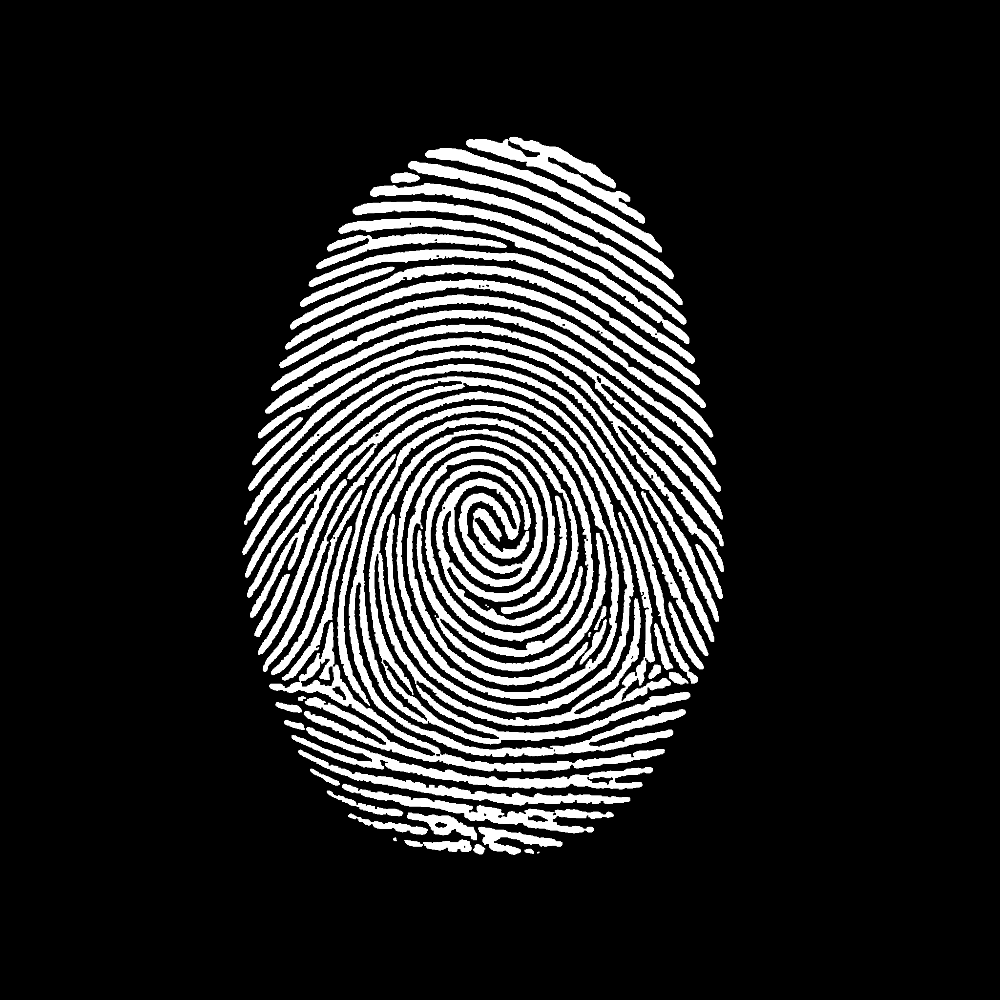

Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Basica e ruido salt and pepper


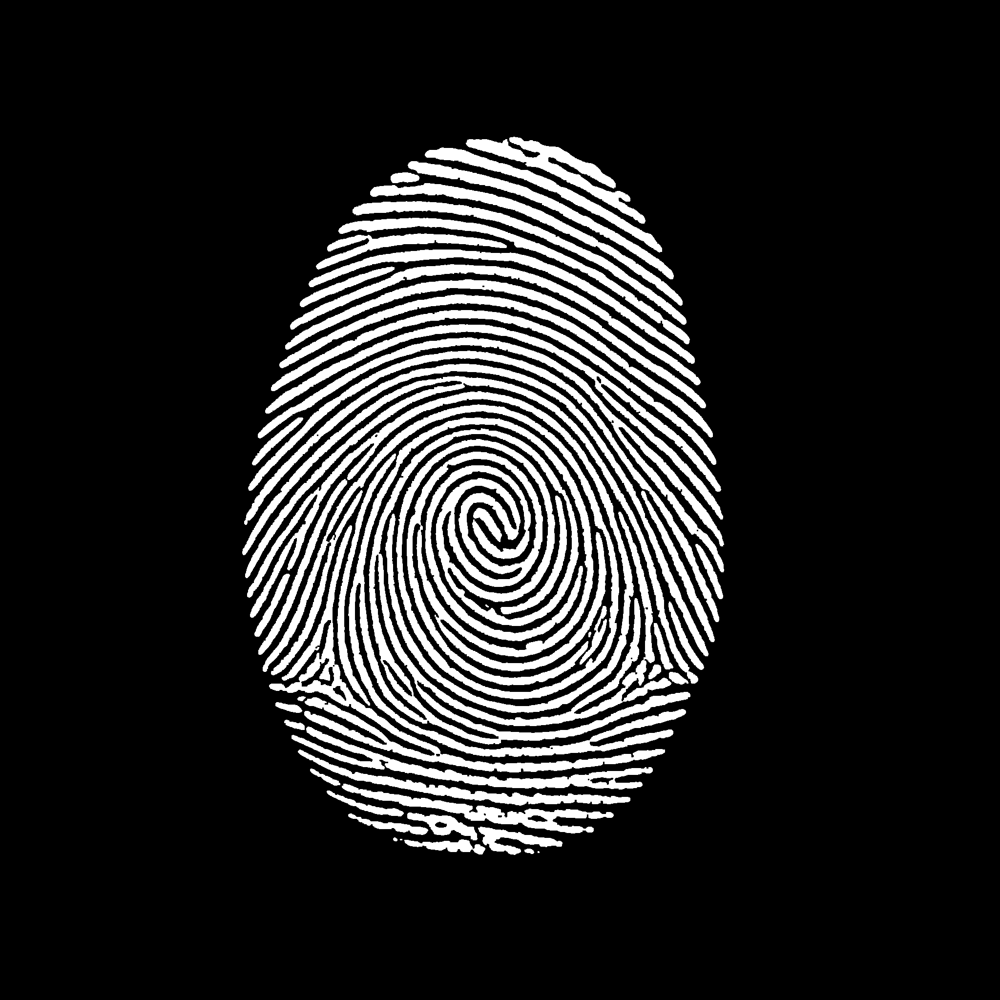

True

In [8]:
# 4. Processamento morfológico (Retirada e Melhoria)
def create_element(size_x, size_y):
   element = np.zeros((size_x, size_y), dtype = np.uint8)
   for i in range(size_x):
      for j in range(size_y):
         element[i,j] = 255
   return element

def add_padding(img, padding_height, padding_width):
    n, m = img.shape

    padded_img = np.zeros((n + padding_height * 2, m + padding_width * 2))
    padded_img[padding_height : n + padding_height, padding_width : m + padding_width] = img

    return padded_img

def morf_dilate_erode(img, kernel, padding=True, dilate=True):
    # Get dimensions of the kernel
    k_height, k_width = kernel.shape  # Atribui valor à variável k_height, k_width

    # Get dimensions of the image
    img_height, img_width = img.shape  # Atribui valor à variável img_height, img_width

    # Calculate padding required
    pad_height = k_height // 2  # Atribui valor à variável pad_height
    pad_width = k_width // 2  # Atribui valor à variável pad_width


    # Create a padded version of the image to handle edges
    if padding == True:
        padded_img = add_padding(img, pad_height, pad_width)  # Atribui valor à variável padded_img

    # Initialize an output image with zeros
    output = np.zeros((img_height, img_width), dtype=float)

    if dilate == True: # Analisa se há algum hit entre elemento e janela
      #Dilate Operation
      for i_img in range(img_height):  # Loop usando i
         for j_img in range(img_width):  # Loop usando j
               match_element = 0
               for i_kernel in range(k_height):
                  for j_kernel in range(k_width):
                           if (kernel[i_kernel, j_kernel] == 255):
                              if(padded_img[i_img+i_kernel, j_img+j_kernel] == kernel[i_kernel, j_kernel]):
                                 match_element = 1
               if(match_element == 1):
                  output[i_img, j_img] = 255
               else:
                  output[i_img, j_img] = 0
    else:
      #Erode Operation
      for i_img in range(img_height):  # Loop usando i
         for j_img in range(img_width):  # Loop usando j
               match_element = 1
               for i_kernel in range(k_height):
                  for j_kernel in range(k_width):
                           if (kernel[i_kernel, j_kernel] == 255):
                              if(padded_img[i_img+i_kernel, j_img+j_kernel] != kernel[i_kernel, j_kernel]):  # Analisa se não há algum hit entre elemento e janela
                                 match_element = 0
               if(match_element == 0):
                  output[i_img, j_img] = 0
               else:
                  output[i_img, j_img] = 255
    return np.array(output, dtype=np.uint8)

element = create_element(3,3)

#Aplicando o processamento morfologico na imagem com limiarizacao basica e ruido gaussiano
#Erosao
img_erode_basica_gaussian = morf_dilate_erode(limiarizacao_basica_gaussian, element, padding=True, dilate=False)

#Abertura(Dilatação)
img_open_basica_gaussian = morf_dilate_erode(img_erode_basica_gaussian, element, padding=True, dilate=True)

#Mais uma dilatação
img_dilate_basica_gaussian = morf_dilate_erode(img_open_basica_gaussian, element, padding=True, dilate=True)

#Fechamento(Erosao)
img_close_basica_gaussian = morf_dilate_erode(img_dilate_basica_gaussian, element, padding=True, dilate=False)
print("Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Basica e ruido gaussiano")
cv2_imshow(img_close_basica_gaussian)
cv2.imwrite('img_morf_basica_gaussian.png', img_close_basica_gaussian)

#Aplicando o processamento morfologico na imagem com limiarizacao basica e ruido salt and pepper
#Erosao
img_erode_basica_saltpepper = morf_dilate_erode(limiarizacao_basica_saltpepper, element, padding=True, dilate=False)

#Abertura(Dilatação)
img_open_basica_saltpepper = morf_dilate_erode(img_erode_basica_saltpepper, element, padding=True, dilate=True)

#Mais uma dilatação
img_dilate_basica_saltpepper = morf_dilate_erode(img_open_basica_saltpepper, element, padding=True, dilate=True)

#Fechamento(Erosao)
img_close_basica_saltpepper = morf_dilate_erode(img_dilate_basica_saltpepper, element, padding=True, dilate=False)
print("Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Basica e ruido salt and pepper")
cv2_imshow(img_close_basica_saltpepper)
cv2.imwrite('img_morf_basica_saltpepper.png', img_close_basica_saltpepper)

Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Otsu


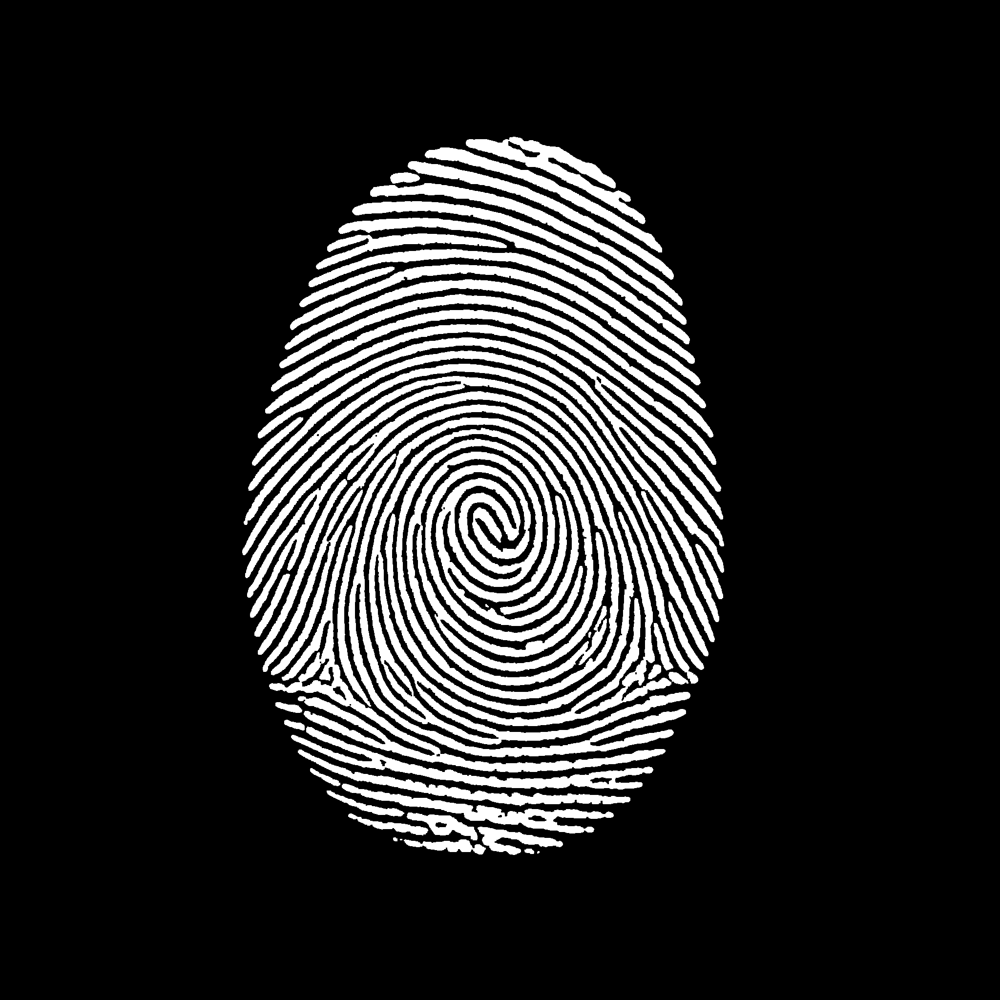

Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Otsu


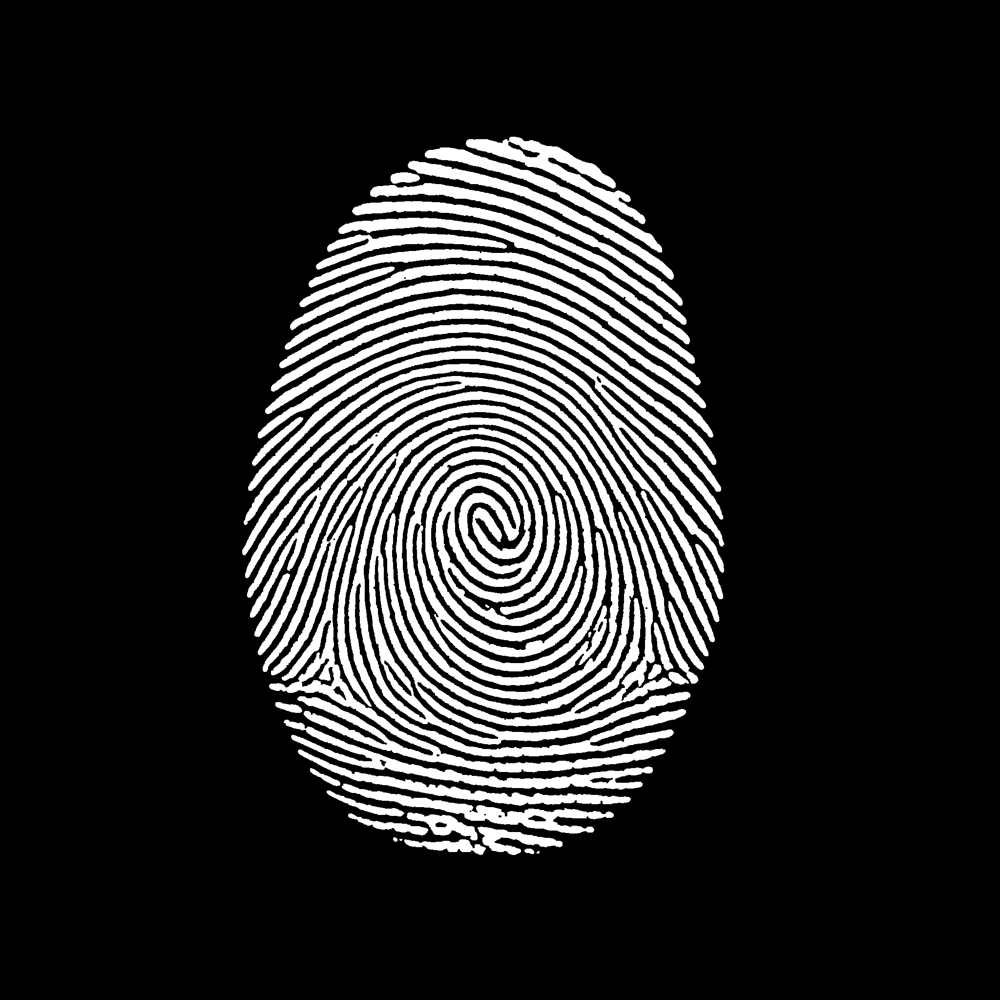

True

In [9]:
#Aplicando o processamento morfologico na imagem com limiarizacao otsu e ruido gaussiano
#Erosao
img_erode_otsu_gaussian = morf_dilate_erode(limiarizacao_otsu_gaussian, element, padding=True, dilate=False)

#Abertura(Dilatação)
img_open_otsu_gaussian = morf_dilate_erode(img_erode_otsu_gaussian, element, padding=True, dilate=True)

#Mais uma dilatação
img_dilate_otsu_gaussian = morf_dilate_erode(img_open_otsu_gaussian, element, padding=True, dilate=True)

#Fechamento(Erosao)
img_close_otsu_gaussian = morf_dilate_erode(img_dilate_otsu_gaussian, element, padding=True, dilate=False)
print("Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Otsu")
cv2_imshow(img_close_otsu_gaussian)
cv2.imwrite('img_morf_otsu_gaussian.png', img_close_otsu_gaussian)

#Aplicando o processamento morfologico na imagem com limiarizacao otsu e ruido salt and pepper
#Erosao
img_erode_otsu_saltpepper = morf_dilate_erode(limiarizacao_otsu_saltpepper, element, padding=True, dilate=False)

#Abertura(Dilatação)
img_open_otsu_saltpepper = morf_dilate_erode(img_erode_otsu_saltpepper, element, padding=True, dilate=True)

#Mais uma dilatação
img_dilate_otsu_saltpepper = morf_dilate_erode(img_open_otsu_saltpepper, element, padding=True, dilate=True)

#Fechamento(Erosao)
img_close_otsu_saltpepper = morf_dilate_erode(img_dilate_otsu_saltpepper, element, padding=True, dilate=False)
print("Resultado final(Após processamento morfológico de melhoria) da Imagem com limiarizacao Otsu")
cv2_imshow(img_close_otsu_saltpepper)
cv2.imwrite('img_morf_otsu_saltpepper.png', img_close_otsu_saltpepper)